# Calibration in wavelength of the  spectra for 205905 data 31 may 2017
==========================================================================================================

- author : Sylvie Dagoret-Campagne
- affiliation : LAL/IN2P3/CNRS FRANCE
- update   : 21th October 2017
- Version : 1.0


- calibrate in wavelength
- Compute uncentainty

In [2]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [3]:
print theNotebook

CalibrateSpectrum


In [4]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

CalibrateSpectrum
ccdproc version 1.2.0
bottleneck version 1.2.1
/Users/dagoret/MacOSX/GitHub/LSST/CTIOAnaJun2017/CTIOAnaJun2017/ana_31may17/HD205905


In [5]:
%config InlineBackend.rc = {}
matplotlib.rc_file("../../templates/matplotlibrc")

/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/__init__.py:913: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [6]:
matplotlib.rcParams.update({'font.size': 22})

In [7]:
import pandas as pd

# Initialization

## Input Directory

In [8]:
inputdir="./spectrum_fitsspec"
MIN_IMGNUMBER=141
MAX_IMGNUMBER=175
object_name='HD205905'
date="20170531"
tag = "finalSpectra"
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

## Output directory

In [9]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./spectrum_calibspec"
ensure_dir(outputdir)

# Open files

## Find where is order 0 in original raw image

- necessary for wavelength calibration

In [10]:
df=pd.read_csv('xy_pointing.csv')
x_star=df["x_pointing"]
y_star=df["y_pointing"]
all_theta=df["theta"]
x_pointing=x_star
y_pointing=y_star

In [11]:
order0_positions = np.array([x_pointing,y_pointing]).T

In [12]:
df.head()

,Unnamed: 0,theta,x_pointing,y_pointing
0,0,-0.625720,845.795879,552.012168
1,1,-0.731443,844.736736,552.904702
2,2,-0.962140,844.674362,551.145843
3,3,-1.841007,844.975521,550.541335
4,4,-1.599145,844.093535,549.984851


# Open Spectra fits file

In [13]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe)

In [14]:
all_dates,all_airmass,all_titles,all_header,all_expo,all_leftspectra,all_rightspectra,all_totleftspectra,all_totrightspectra,all_filt,all_filt1,all_filt2,all_elecgain=BuildRawSpec(sorted_files,sorted_numbers,object_name)

In [15]:
print all_filt

['RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP']


# Disperser sorting

In [16]:
filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx=get_filt_idx(all_filt)

In [17]:
print  Filt_names[0],' \t : filt0_idx :: ',filt0_idx
print  Filt_names[1],' \t : filt1_idx :: ',filt1_idx
print  Filt_names[2],' \t : filt2_idx :: ',filt2_idx
print  Filt_names[3],' \t : filt3_idx :: ',filt3_idx
print  Filt_names[4],' \t : filt4_idx :: ',filt4_idx
print  Filt_names[5],' \t : filt5_idx :: ',filt5_idx
print  Filt_names[6],' \t : filt6_idx :: ',filt6_idx

dia Ron400  	 : filt0_idx ::  [ 0  5 10 15 20 25 30]
dia Thor300  	 : filt1_idx ::  [ 1  6 11 16 21 26 31]
dia HoloPhP  	 : filt2_idx ::  [ 2  7 12 17 22 27 32]
dia HoloPhAg  	 : filt3_idx ::  [ 3  8 13 18 23 28]
dia HoloAmAg  	 : filt4_idx ::  [ 4  9 14 19 24 29]
dia Ron200  	 : filt5_idx ::  []
Unknown  	 : filt6_idx ::  []


# Show Raw Spectra
-----------------------

In [18]:
len(all_rightspectra)

33

/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


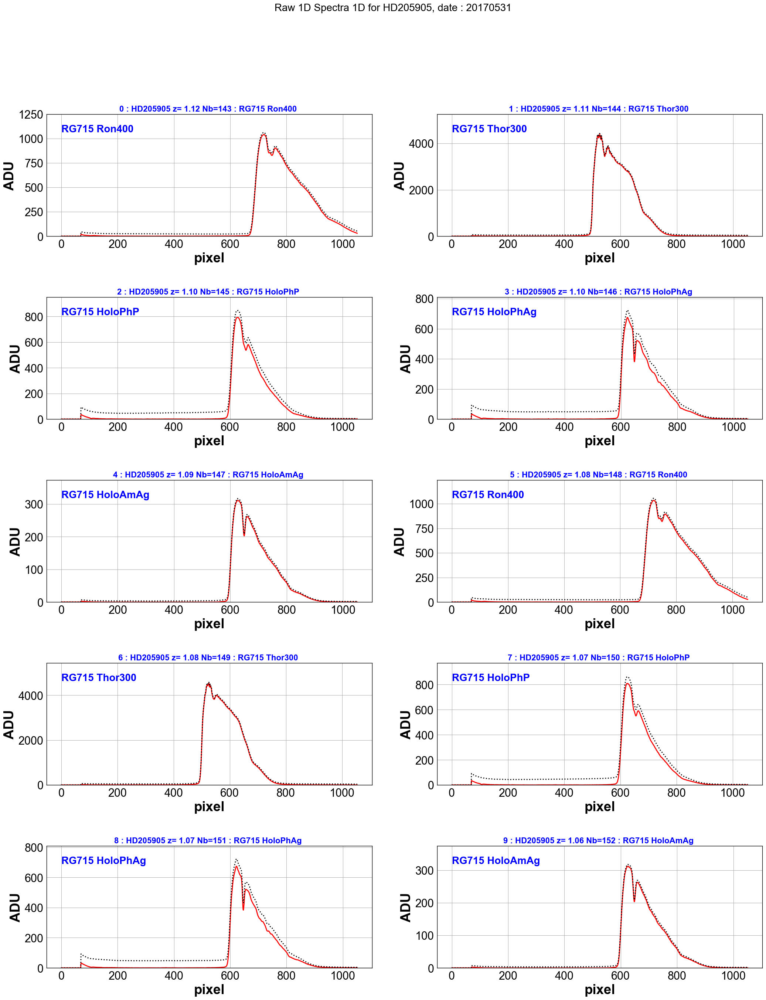

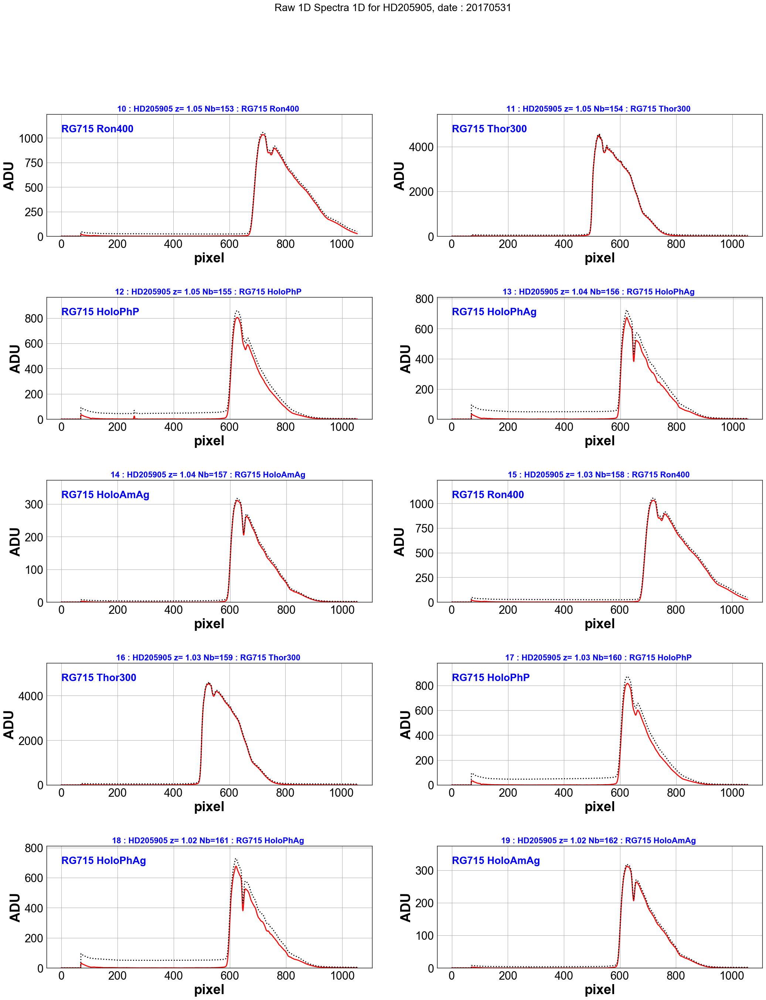

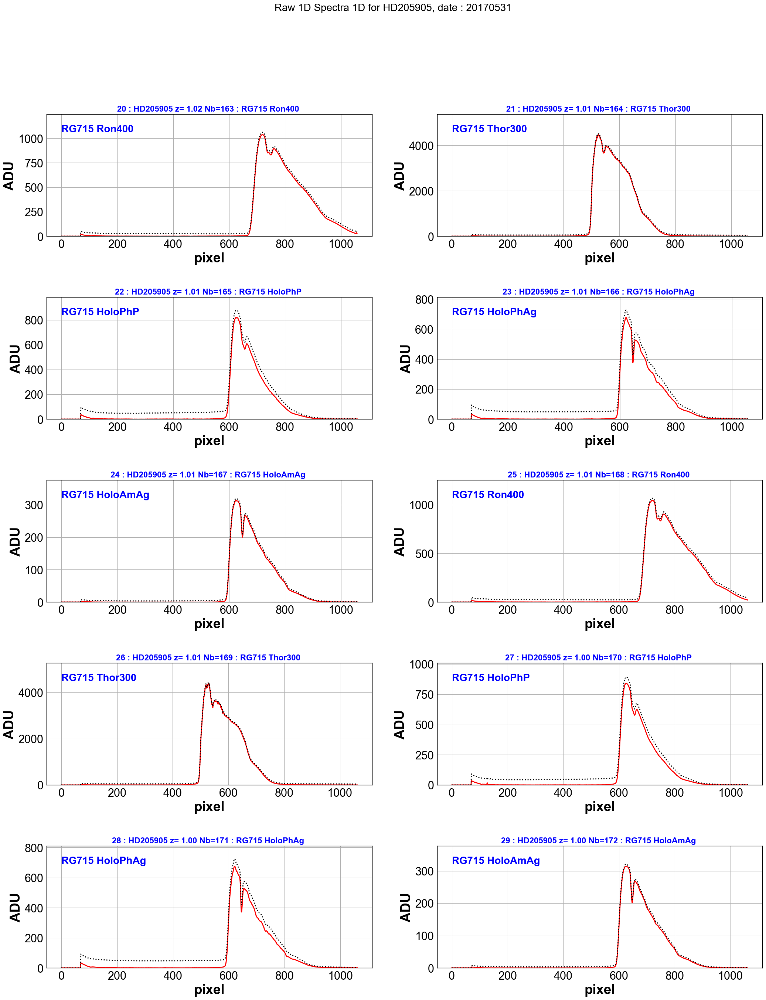

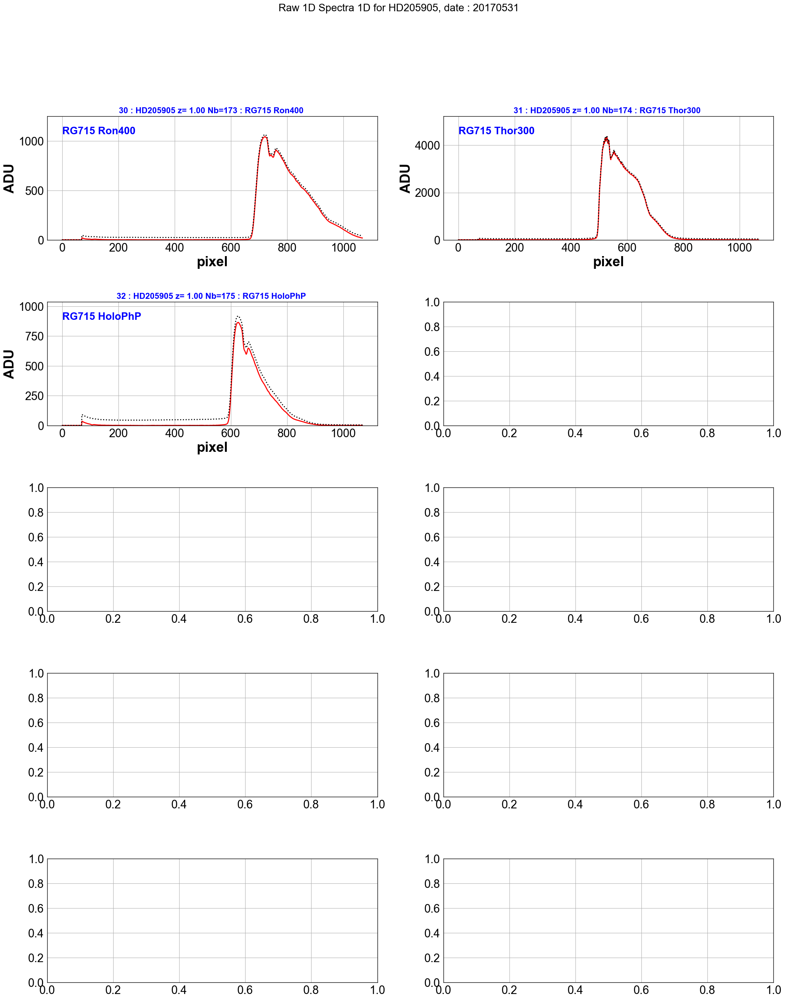

In [19]:
ShowExtrSpectrainPDF(all_rightspectra,all_totrightspectra,all_titles,object_name,dir_top_images,all_filt,date,'raw1Dspectra_right.pdf')

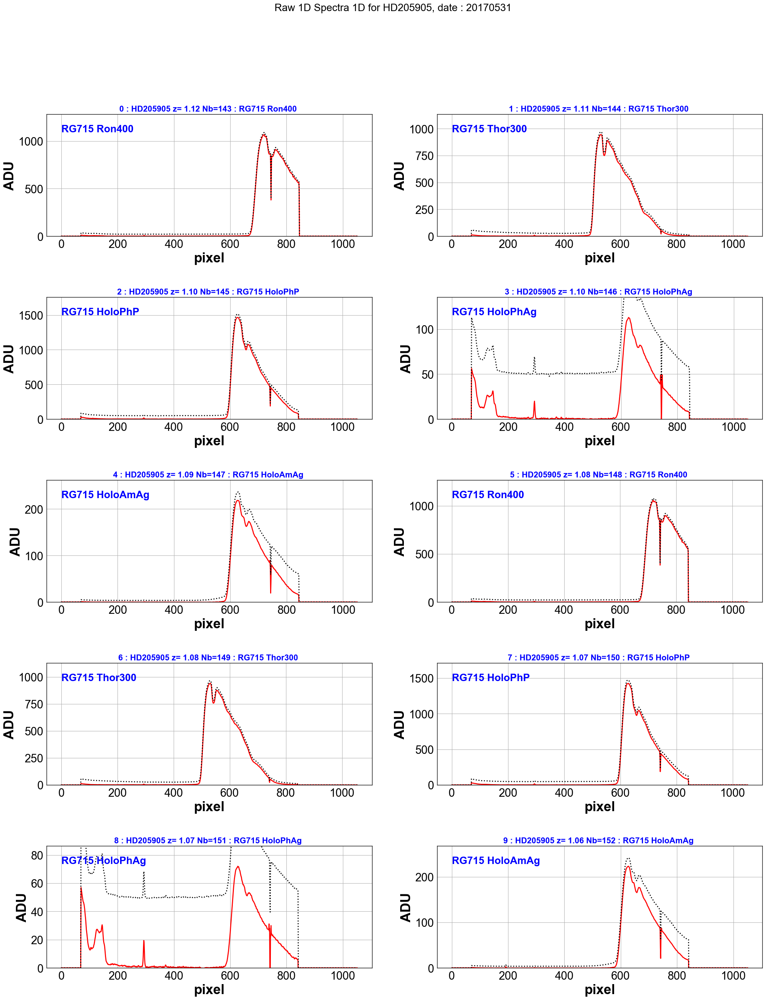

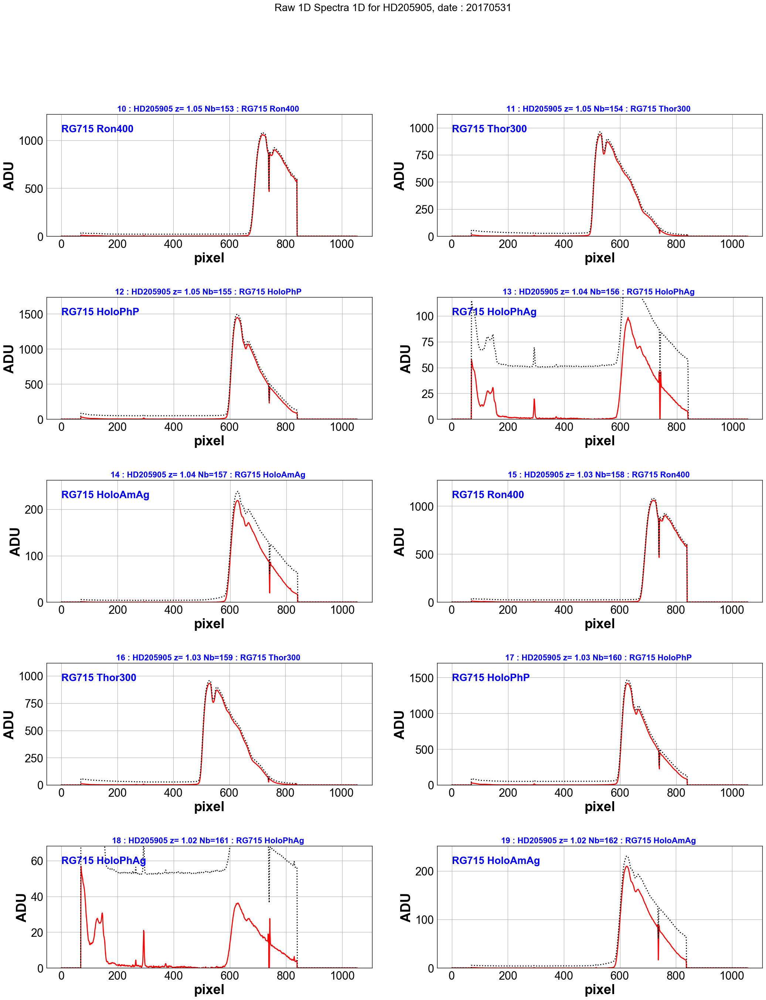

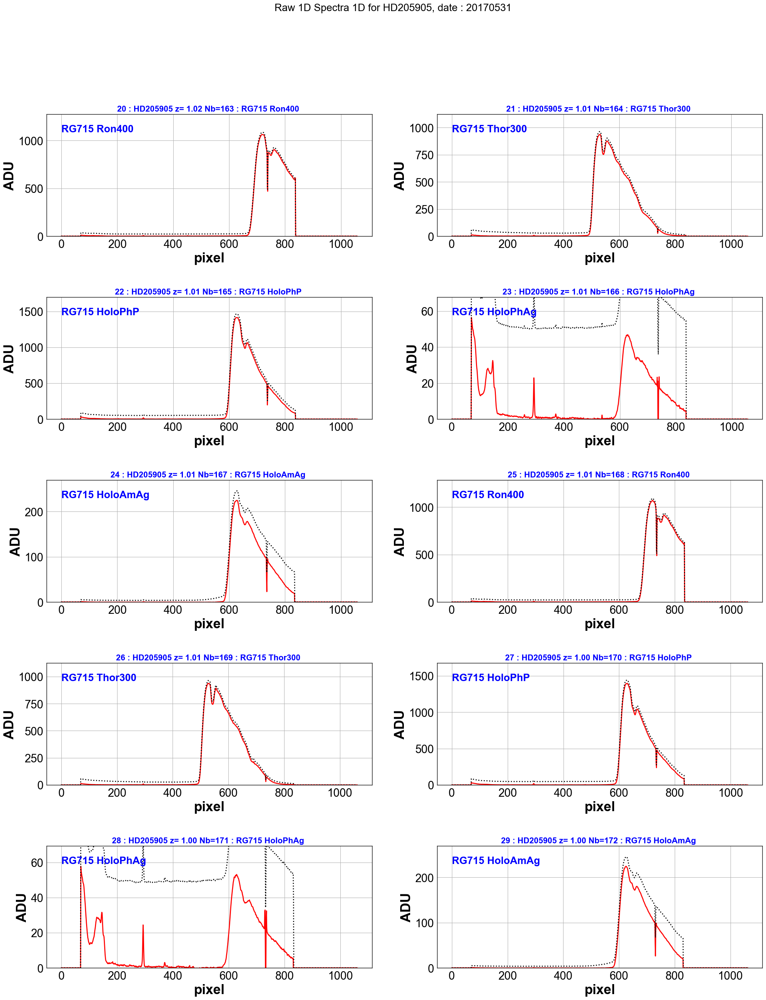

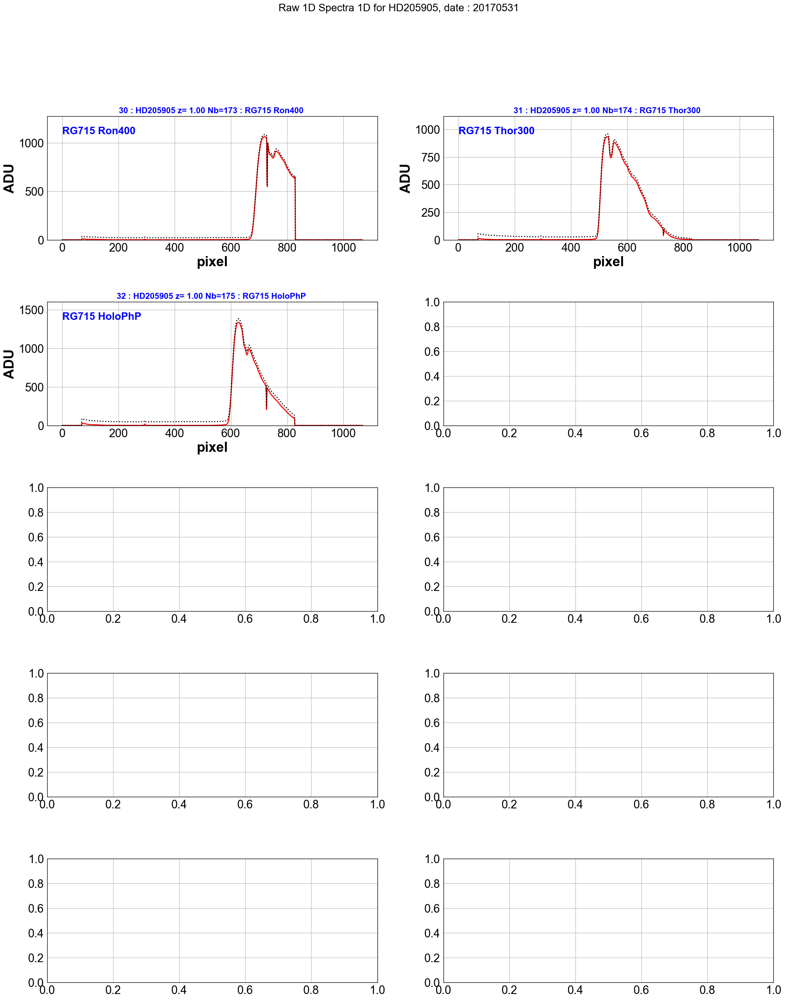

In [20]:
 ShowExtrSpectrainPDF(all_leftspectra,all_totleftspectra,all_titles,object_name,dir_top_images,all_filt,date,'raw1Dspectra_left.pdf')

# Calibrate in wavelength

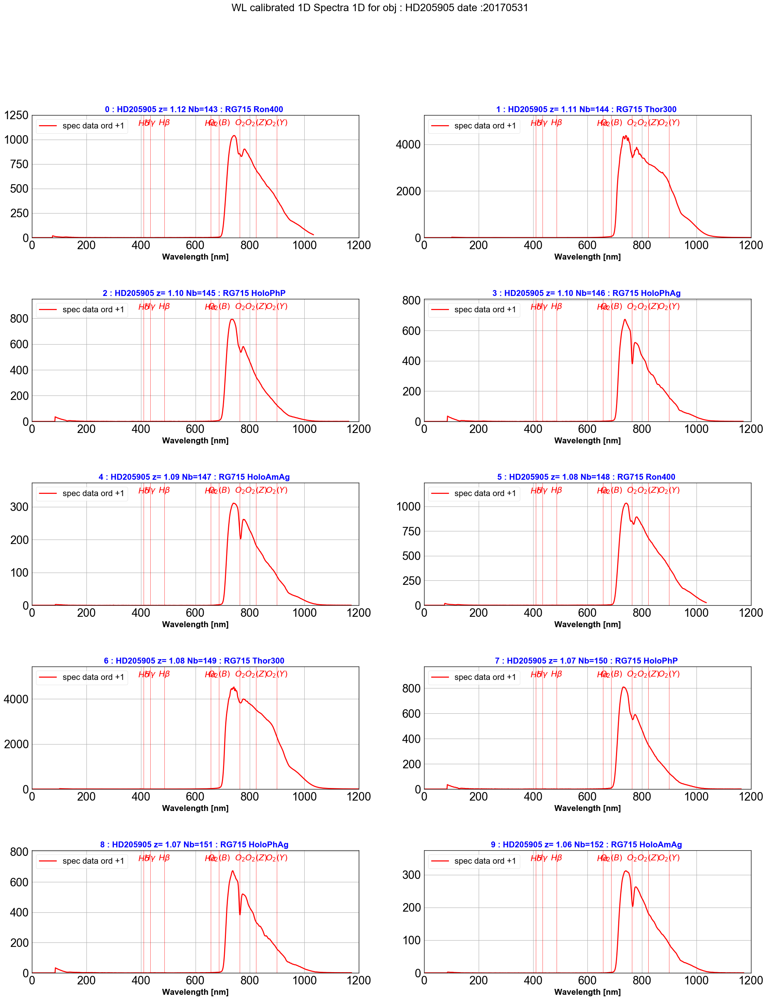

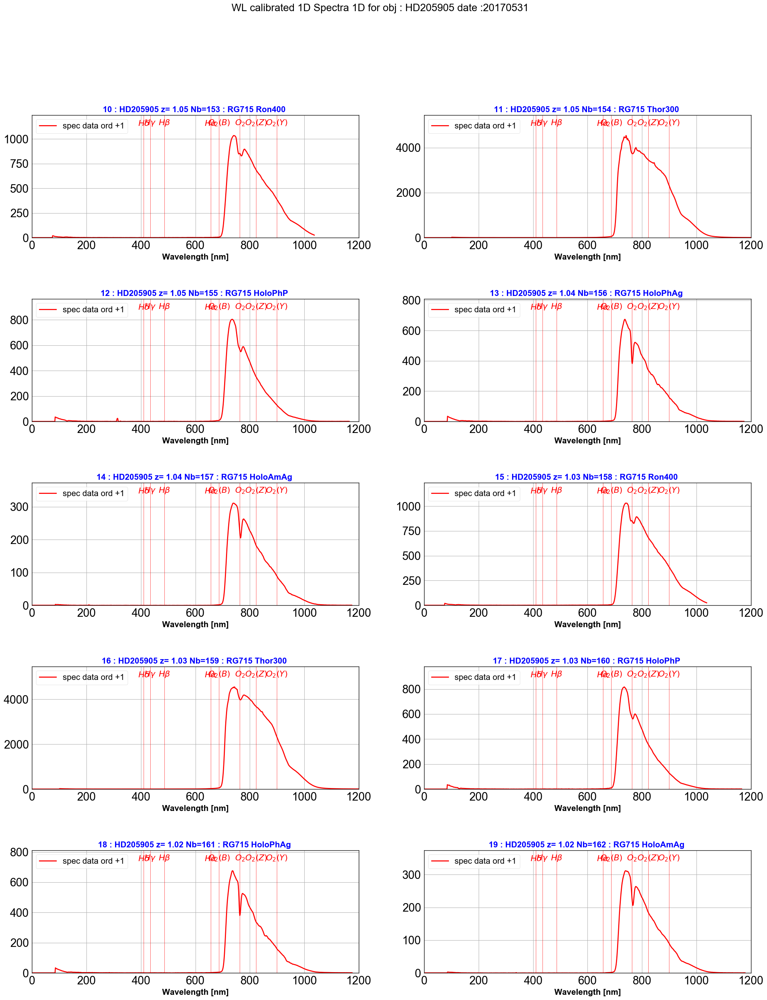

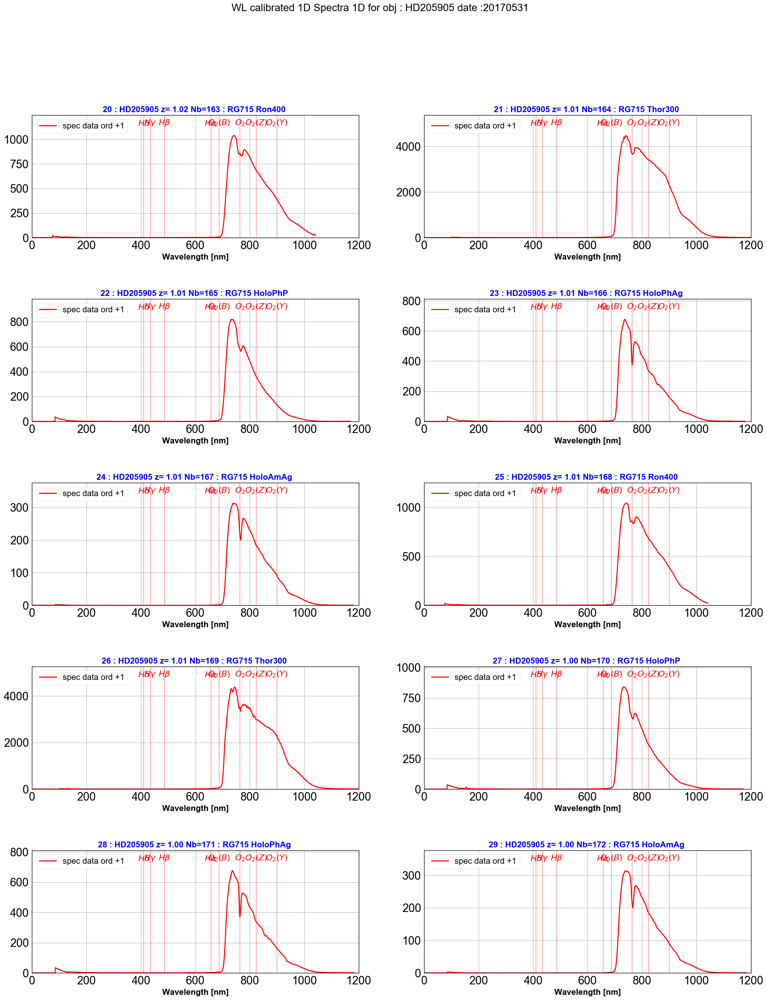

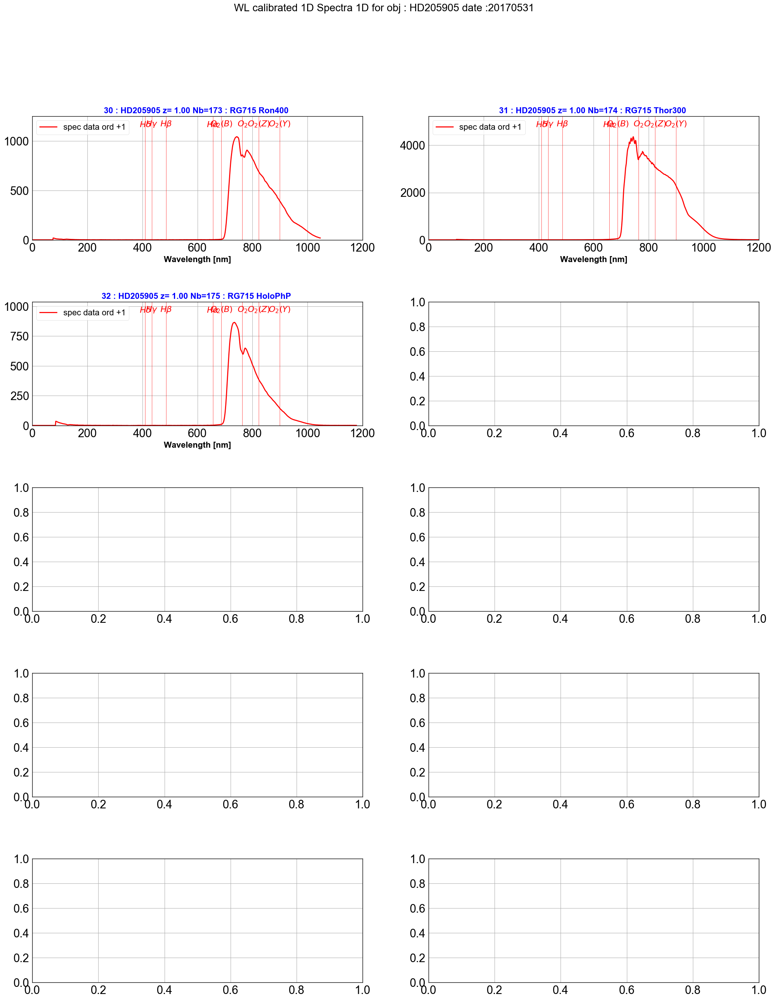

In [21]:
all_wl_right=CALSPECAbsLineIdentificationinPDF(all_rightspectra,order0_positions,all_titles,object_name,dir_top_images,all_filt,date,'CALSPEC_rightspectrum.pdf','spec data ord +1')

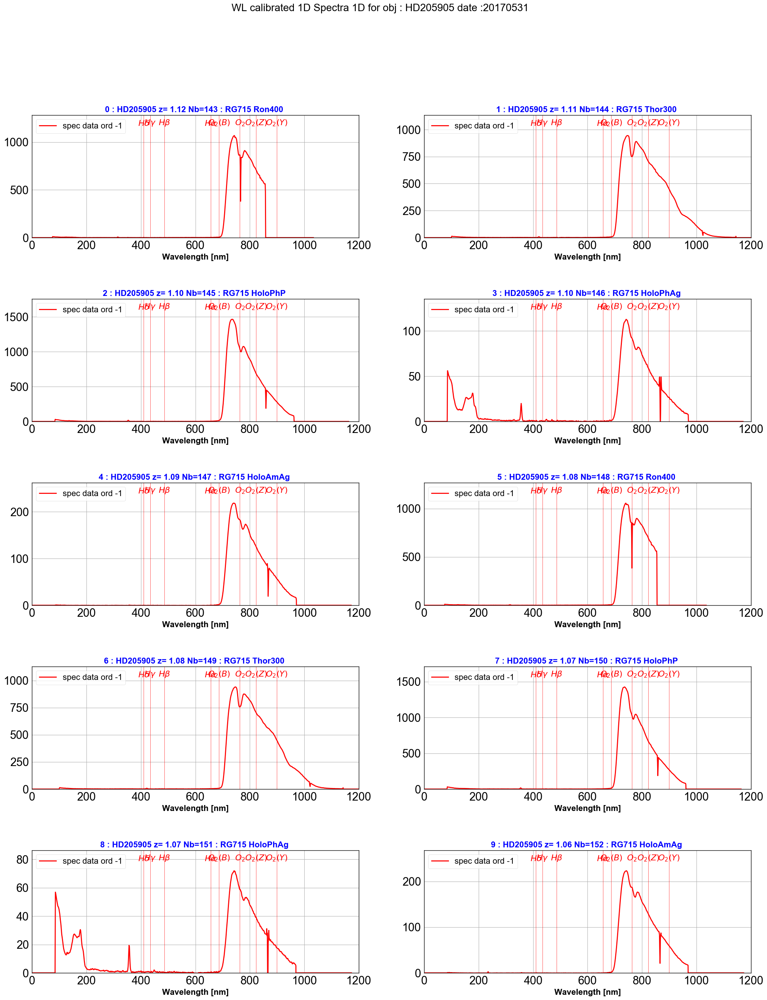

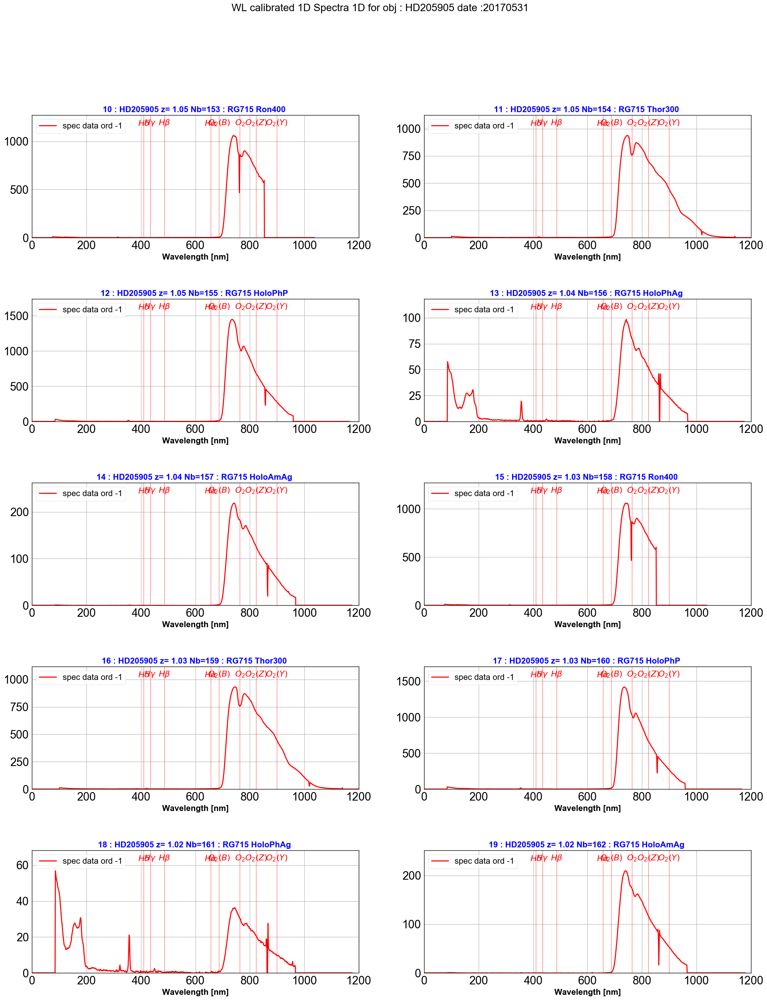

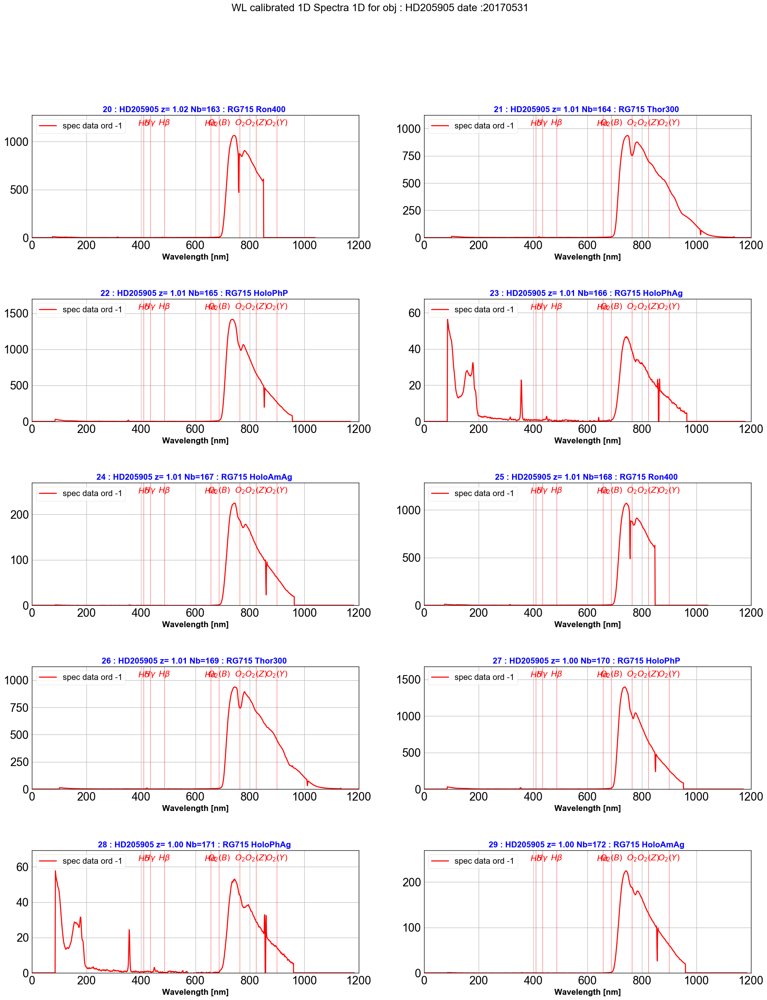

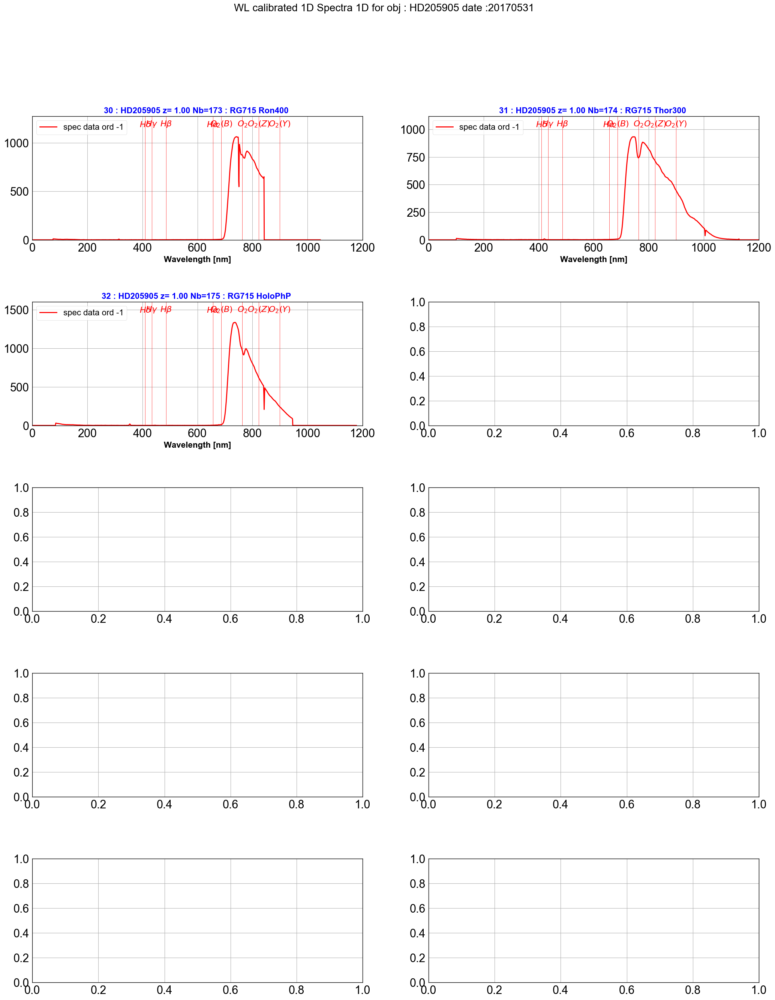

In [22]:
all_wl_left=CALSPECAbsLineIdentificationinPDF(all_leftspectra,order0_positions,all_titles,object_name,dir_top_images,all_filt,date,'CALSPEC_leftspectrum.pdf','spec data ord -1')

## Compare spectra

- Compare the different spectra of the same disperser inside the run

In [23]:
import matplotlib 
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10) 

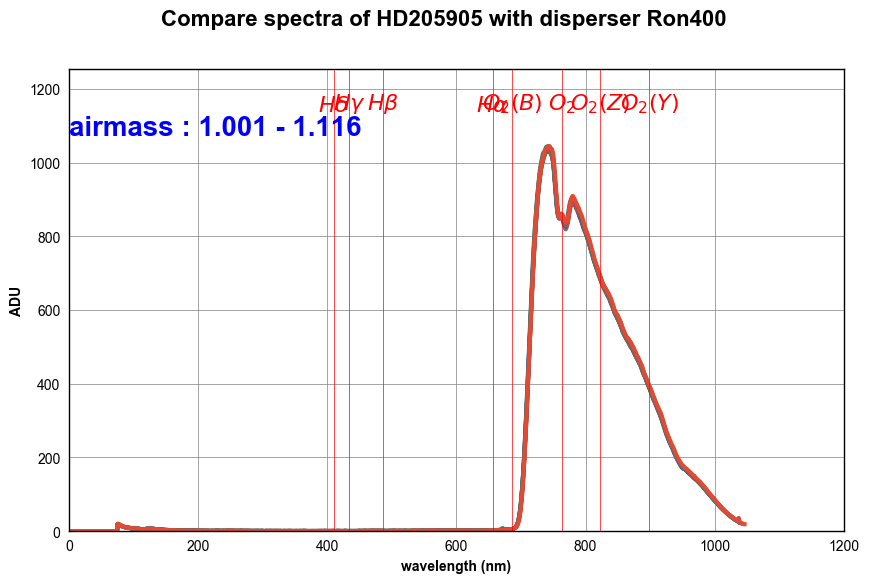

In [24]:
if filt0_idx.shape[0] >0:
    CompareSpectrumProfile(all_wl_right,all_rightspectra,all_titles,all_airmass,object_name,all_filt,dir_top_images,'Ron400',filt0_idx)

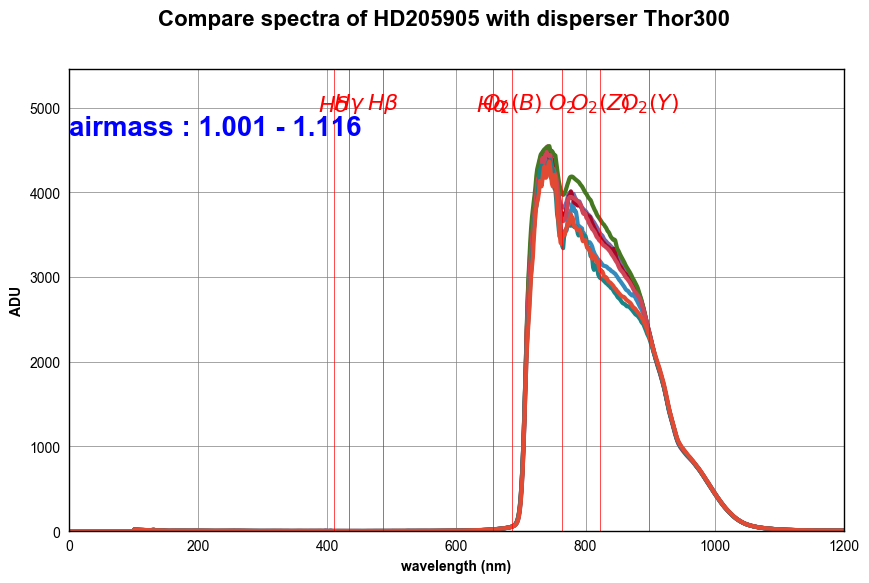

In [25]:
if filt1_idx.shape[0] >0:
    CompareSpectrumProfile(all_wl_right,all_rightspectra,all_titles,all_airmass,object_name,all_filt,dir_top_images,'Thor300',filt1_idx)

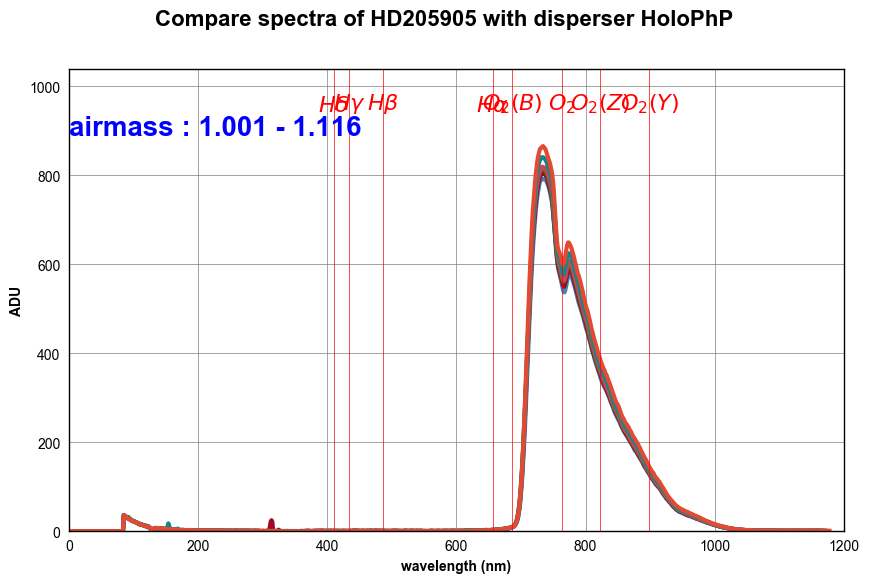

In [26]:
if filt2_idx.shape[0] >0:
    CompareSpectrumProfile(all_wl_right,all_rightspectra,all_titles,all_airmass,object_name,all_filt,dir_top_images,'HoloPhP',filt2_idx)

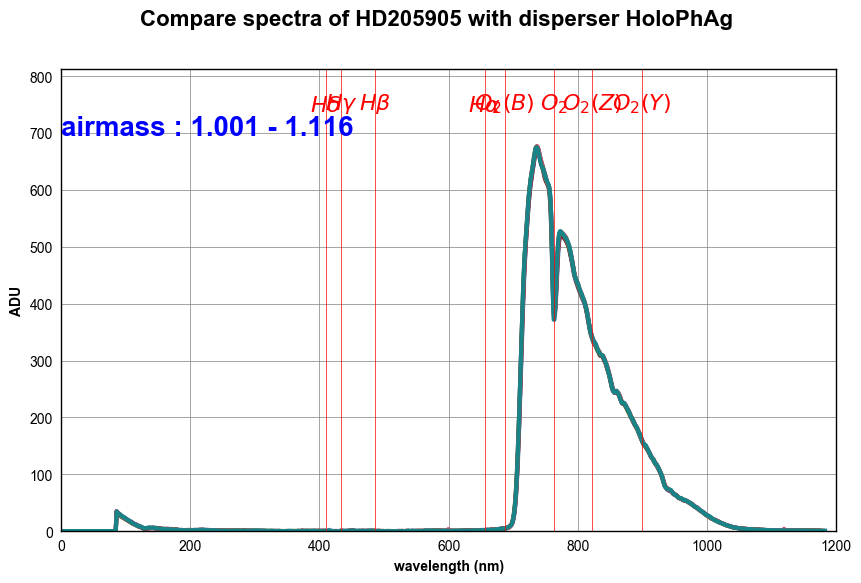

In [27]:
if filt3_idx.shape[0] >0:
    CompareSpectrumProfile(all_wl_right,all_rightspectra,all_titles,all_airmass,object_name,all_filt,dir_top_images,'HoloPhAg',filt3_idx)

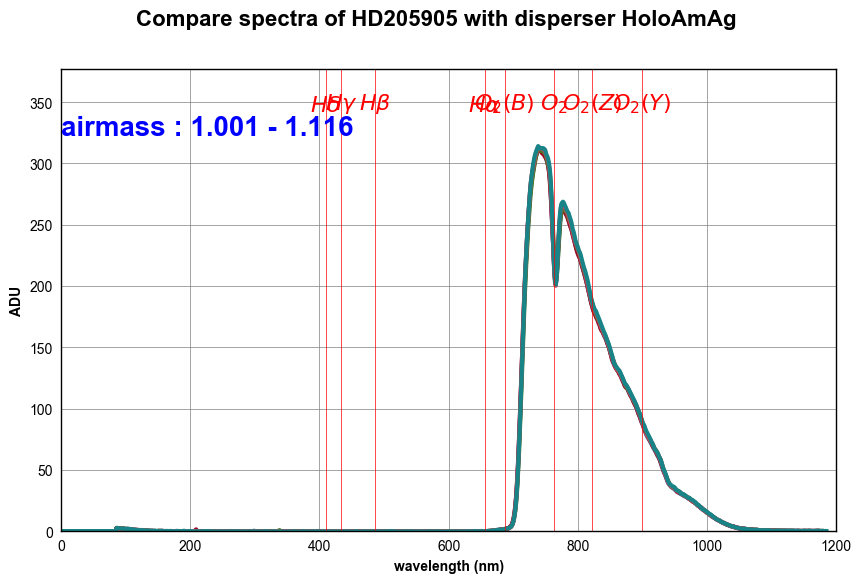

In [28]:
if filt4_idx.shape[0] >0:
    CompareSpectrumProfile(all_wl_right,all_rightspectra,all_titles,all_airmass,object_name,all_filt,dir_top_images,'HoloAmAg',filt4_idx)

In [29]:
if filt5_idx.shape[0] >0:
    CompareSpectrumProfile(all_wl_right,all_rightspectra,all_titles,all_airmass,object_name,all_filt,dir_top_images,'Ron200',filt5_idx)

# Compute statistical error

In [30]:
print all_elecgain

[3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0]


In [31]:
print all_expo

[120.0, 120.0, 120.0, 240.0, 240.0, 120.0, 120.0, 120.0, 240.0, 240.0, 120.0, 120.0, 120.0, 240.0, 240.0, 120.0, 120.0, 120.0, 240.0, 240.0, 120.0, 120.0, 120.0, 240.0, 240.0, 120.0, 120.0, 120.0, 240.0, 240.0, 120.0, 120.0, 120.0]


In [32]:
def ComputeStatisticalError(all_wl,all_spectra,all_totspectra,all_titles,object_name,all_filt,dir_top_img,figname,gain,expositiontime):
    """
    ComputeStatisticalError : 
    
    """
    NBSPEC=len(all_spectra)
    NBIMGPERROW=2
    MAXIMGROW=max(2,m.ceil(NBSPEC/NBIMGPERROW))
   
    all_stastistical_errors = []    
        
     # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,figname)
    pp = PdfPages(figfilename) # create a pdf file
    
    title='Calibrated spectra with stat errors for {}'.format(object_name)
         
    
    
    for index in np.arange(0,NBSPEC):
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20,fontweight='bold')
 
  


        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        wl=all_wl[index]  # wavelength in data
        
        spectrum=np.array(all_spectra[index])   # data
        totspectrum=np.array(all_totspectra[index])
        staterrors=np.sqrt(totspectrum)/np.sqrt(gain[index]*expositiontime[index])
        
       
        axarr[iy,ix].errorbar(wl,spectrum,yerr=staterrors,fmt='o',color='red',lw=2,label='data') # plot data
        
        
        all_stastistical_errors.append(staterrors)
        
        max_y_to_plot=spectrum[:].max()*1.2
        
        max_y_to_plot=max_y_to_plot*0.15
        
        
        axarr[iy,ix].set_ylim(0.,max_y_to_plot)
        axarr[iy,ix].set_xlim(0.,1200.)
        axarr[iy,ix].text(0.,max_y_to_plot*1.1/1.2, all_filt[index],verticalalignment='top', horizontalalignment='left',color='blue',fontweight='bold', fontsize=20)
       
        axarr[iy,ix].set_title(all_titles[index])
        
        axarr[iy,ix].set_xlabel("wavelength (nm)")
        
        #axarr[iy,ix].get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        #axarr[iy,ix].get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].grid(b=True, which='major', color='grey', linewidth=0.5)
        #axarr[iy,ix].grid(b=True, which='minor', color='grey', linewidth=0.5)
      
        axarr[iy,ix].legend()
        
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
            
                
          
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()
    return all_stastistical_errors
    
    

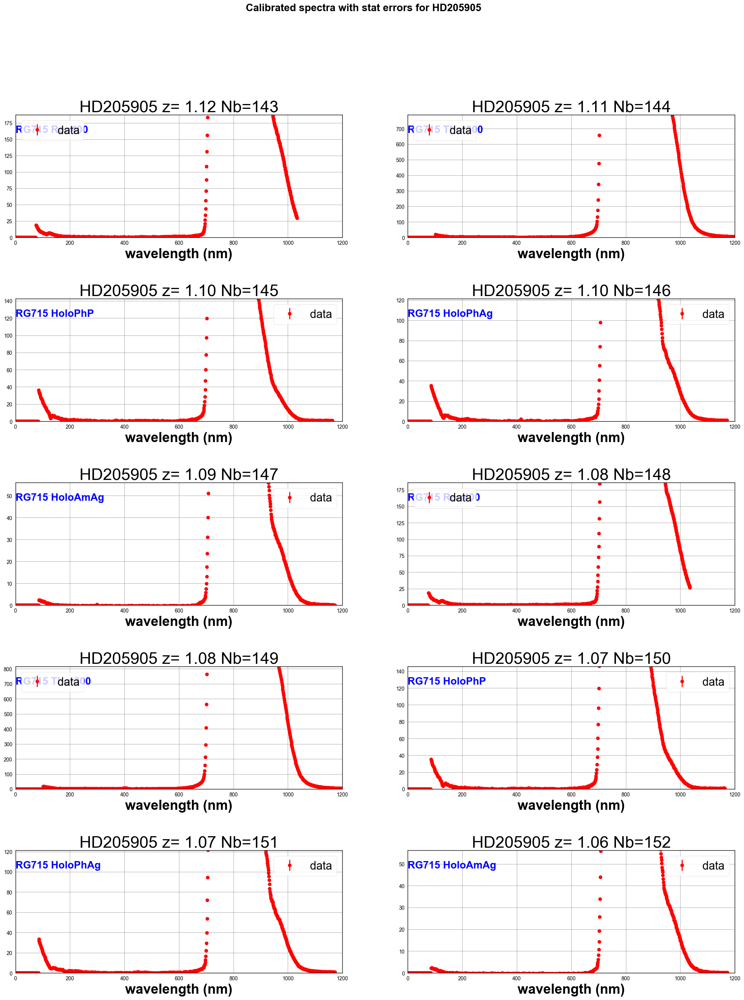

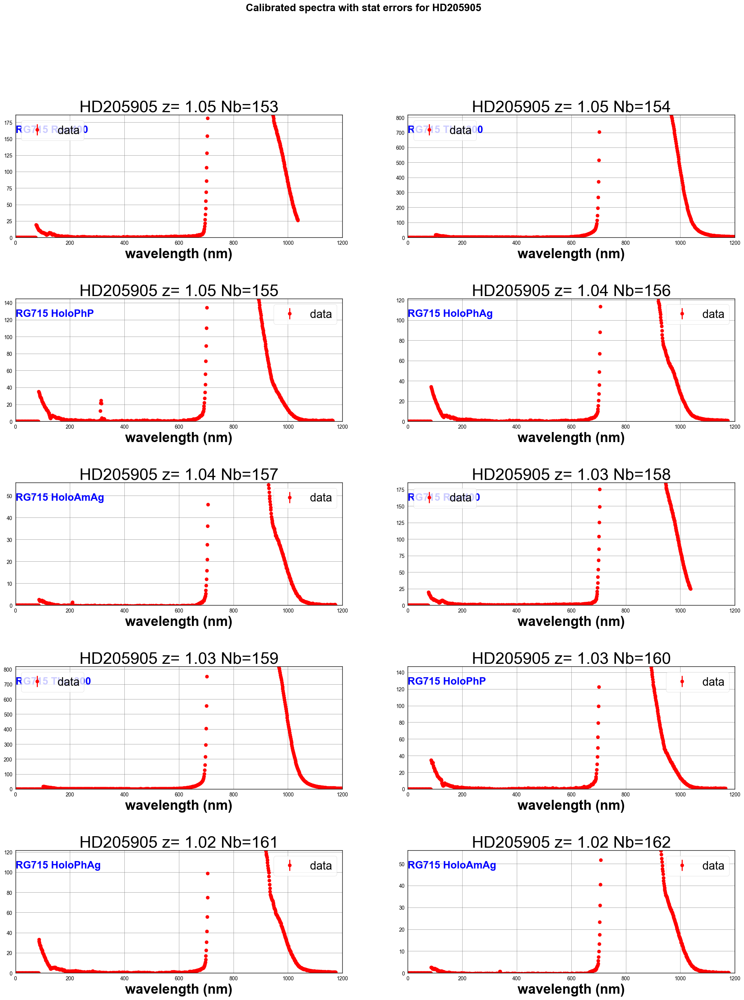

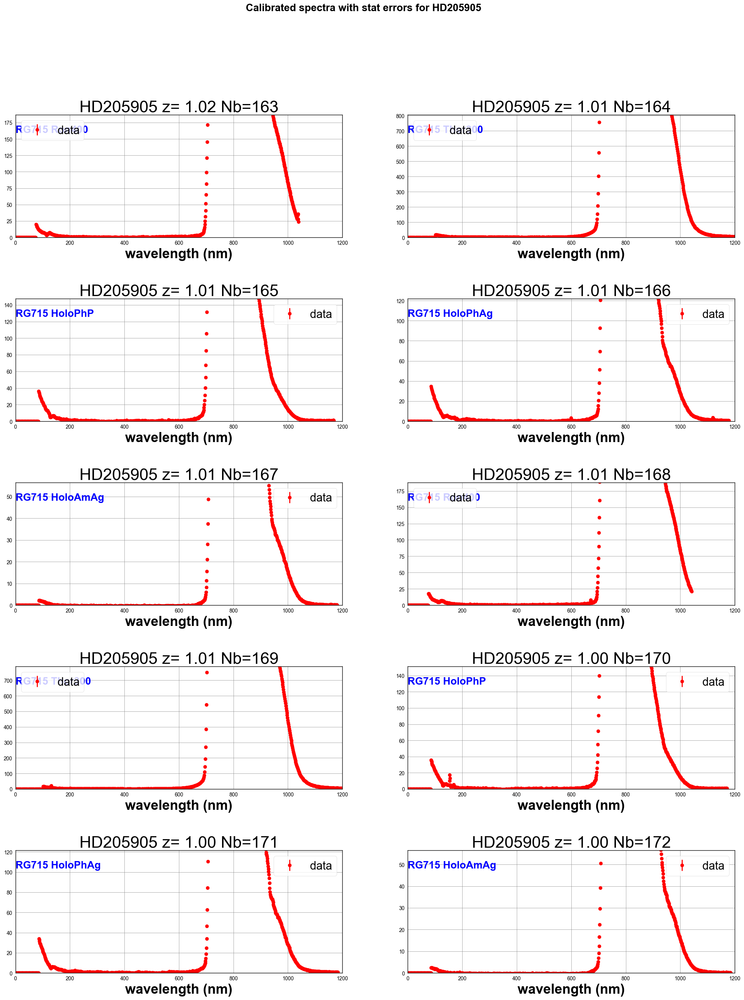

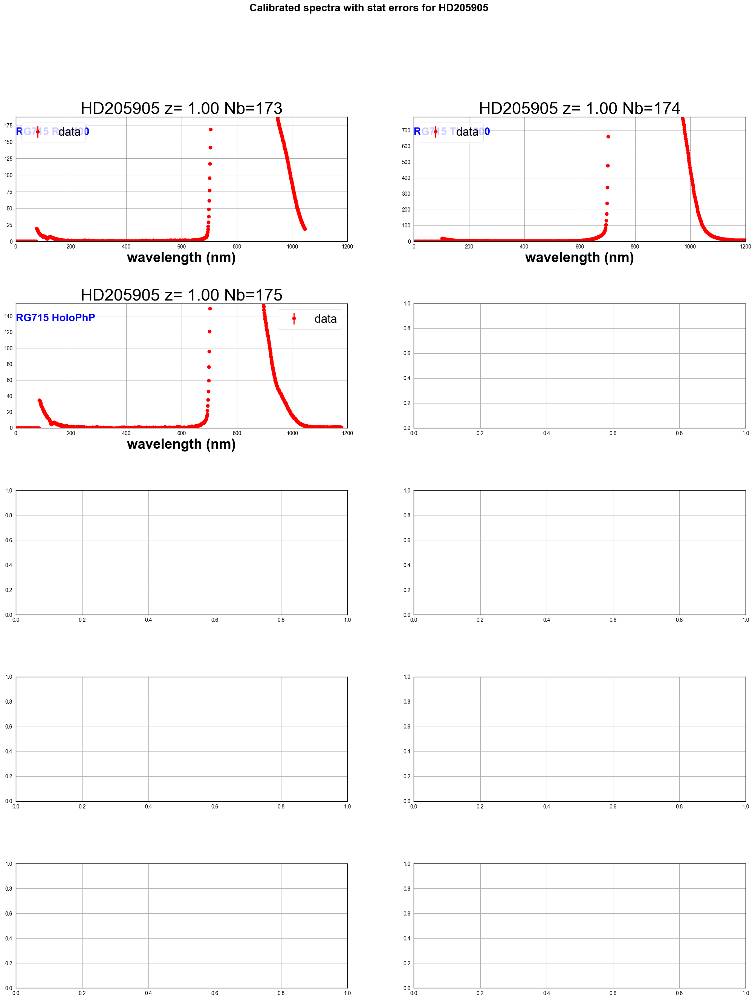

In [33]:
all_rightstastistical_errors=ComputeStatisticalError(all_wl_right,all_rightspectra,all_totrightspectra,all_titles,object_name,all_filt,dir_top_images,'RightSpectraStatErrors.pdf',all_elecgain,all_expo)

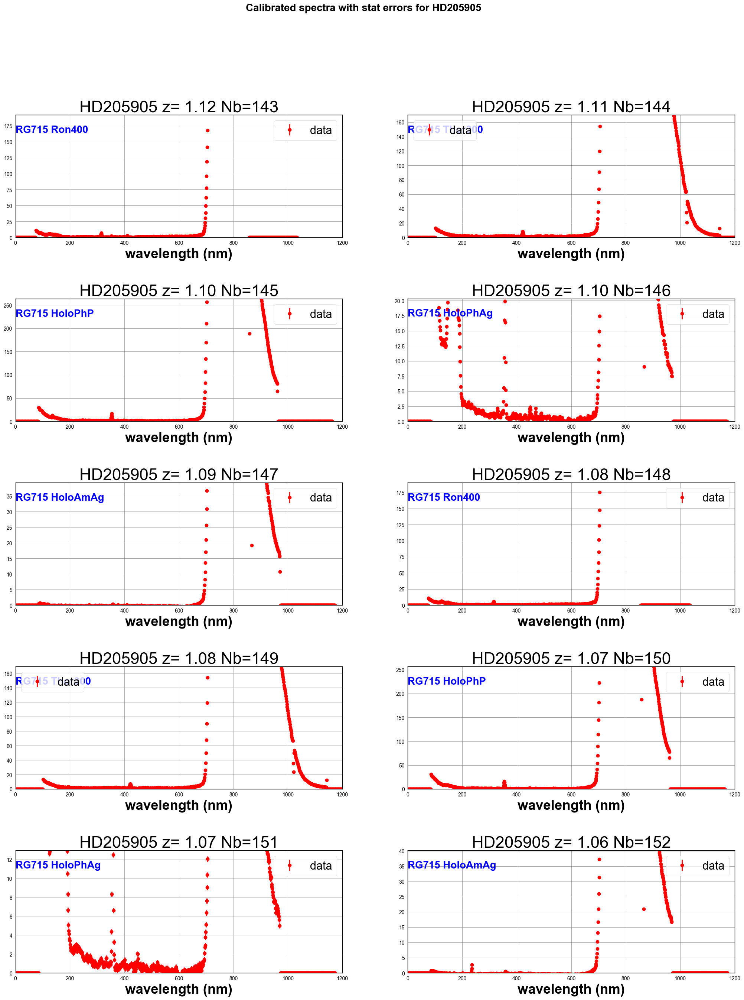

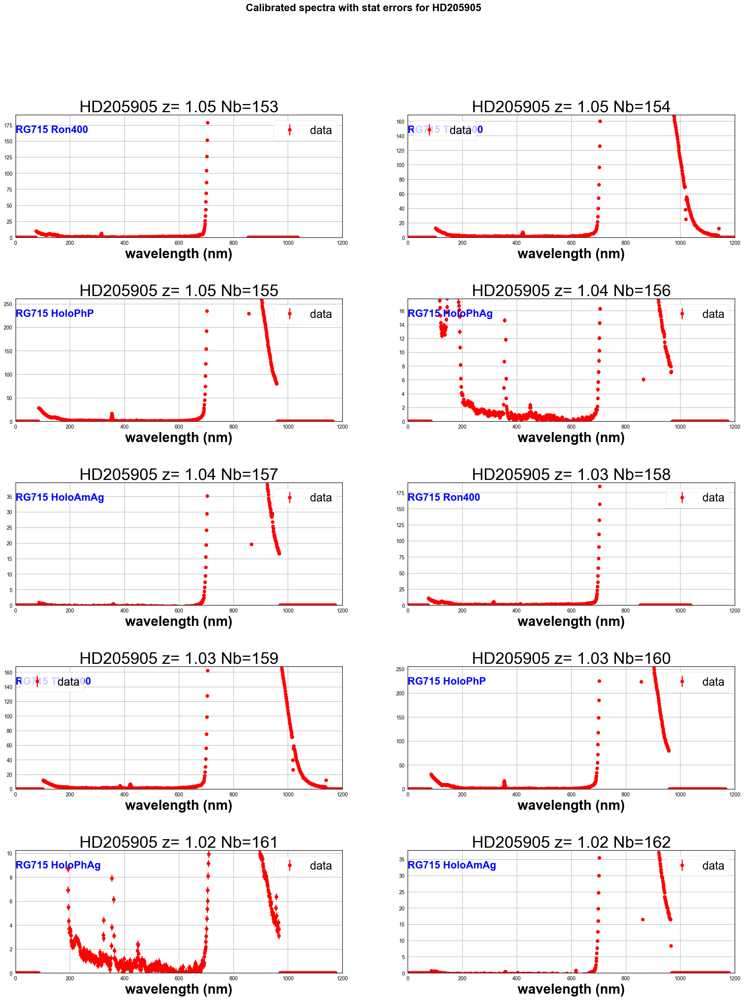

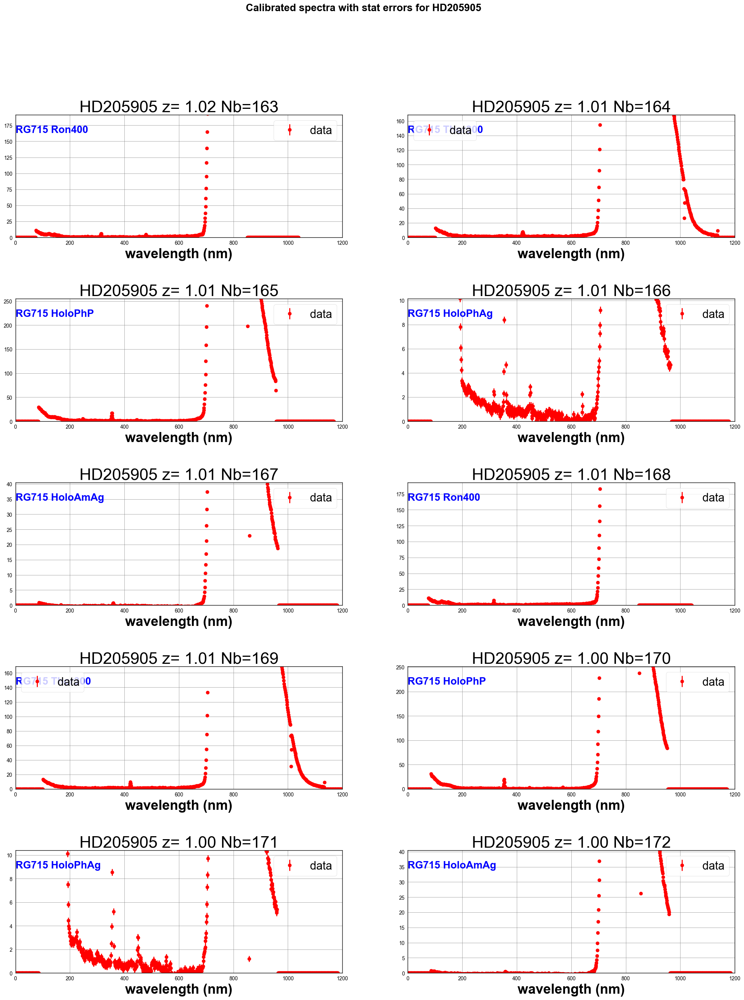

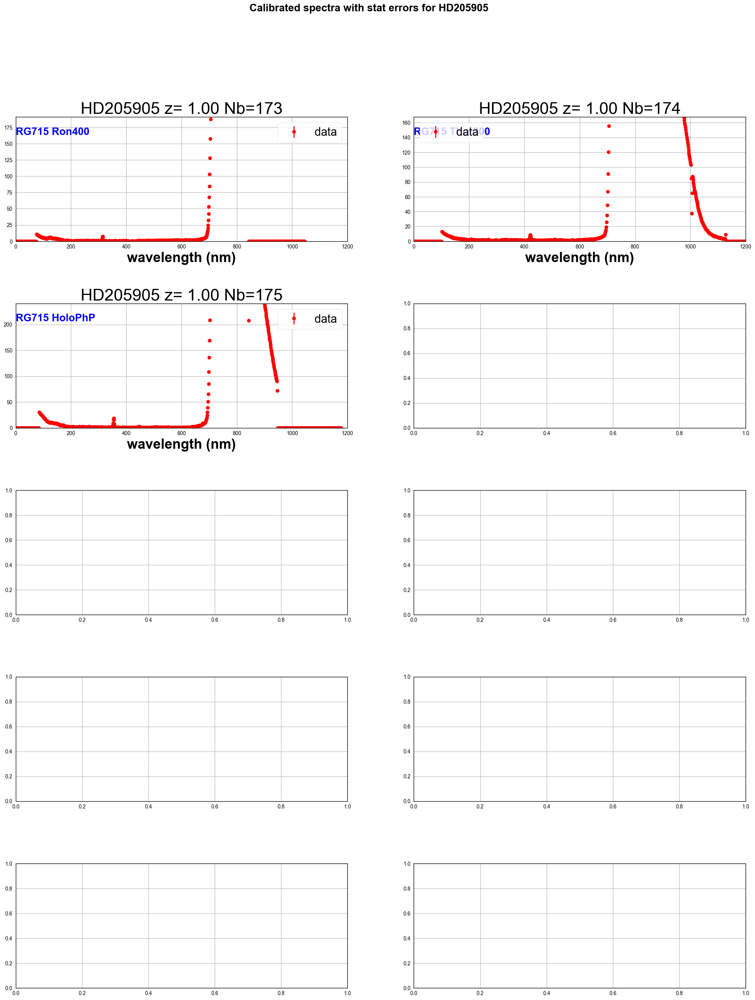

In [34]:
all_leftstastistical_errors=ComputeStatisticalError(all_wl_left,all_leftspectra,all_totleftspectra,all_titles,object_name,all_filt,dir_top_images,'LeftSpectraStatErrors.pdf',all_elecgain,all_expo)

# Save outputfilename
Results of the fits for right and left spectra are saved as images

In [35]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^finalSpectra_(.*)',short_infilename)
    short_outfilename='calibSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

In [36]:
newfullfilenames[0:5]

['./spectrum_calibspec/calibSpectra_20170531_143.fits',
 './spectrum_calibspec/calibSpectra_20170531_144.fits',
 './spectrum_calibspec/calibSpectra_20170531_145.fits',
 './spectrum_calibspec/calibSpectra_20170531_146.fits',
 './spectrum_calibspec/calibSpectra_20170531_147.fits']

In [37]:
#
#  New fashion to save a binary table outside the primary header
#
for idx,file in np.ndenumerate(newfullfilenames):
    primhdu = fits.PrimaryHDU(header=all_header[idx[0]])   # make an primary HDU without data
    
    col1=fits.Column(name='CalibLeftSpecWL',format='E',array=all_wl_left[idx[0]])
    col2=fits.Column(name='CalibLeftSpec',format='E',array=all_leftspectra[idx[0]])
    col3=fits.Column(name='CalibTotLeftSpec',format='E',array=all_totleftspectra[idx[0]])
    col4=fits.Column(name='CalibRightSpecWL',format='E',array=all_wl_right[idx[0]])
    col5=fits.Column(name='CalibRightSpec',format='E',array=all_rightspectra[idx[0]])
    col6=fits.Column(name='CalibTotRightSpec',format='E',array=all_totrightspectra[idx[0]])
    col7=fits.Column(name='CalibStatErrorLeftSpec',format='E',array=all_leftstastistical_errors[idx[0]])
    col8=fits.Column(name='CalibStatErrorRightSpec',format='E',array=all_rightstastistical_errors[idx[0]])
    cols=fits.ColDefs([col1,col2,col3,col4,col5,col6,col7,col8])
   
    
    tbhdu = fits.BinTableHDU.from_columns(cols)     # new binary table HDU
    thdulist = fits.HDUList([primhdu, tbhdu])
    
    thdulist.writeto(file,overwrite=True)

In [38]:
!ls -l ./spectrum_calibspec

total 3168
-rw-r--r--  1 dagoret  staff  48960 Oct 23 12:58 calibSpectra_20170531_143.fits
-rw-r--r--  1 dagoret  staff  48960 Oct 23 12:58 calibSpectra_20170531_144.fits
-rw-r--r--  1 dagoret  staff  48960 Oct 23 12:58 calibSpectra_20170531_145.fits
-rw-r--r--  1 dagoret  staff  48960 Oct 23 12:58 calibSpectra_20170531_146.fits
-rw-r--r--  1 dagoret  staff  48960 Oct 23 12:58 calibSpectra_20170531_147.fits
-rw-r--r--  1 dagoret  staff  48960 Oct 23 12:58 calibSpectra_20170531_148.fits
-rw-r--r--  1 dagoret  staff  48960 Oct 23 12:58 calibSpectra_20170531_149.fits
-rw-r--r--  1 dagoret  staff  48960 Oct 23 12:58 calibSpectra_20170531_150.fits
-rw-r--r--  1 dagoret  staff  48960 Oct 23 12:58 calibSpectra_20170531_151.fits
-rw-r--r--  1 dagoret  staff  48960 Oct 23 12:58 calibSpectra_20170531_152.fits
-rw-r--r--  1 dagoret  staff  48960 Oct 23 12:58 calibSpectra_20170531_153.fits
-rw-r--r--  1 dagoret  staff  48960 Oct 23 12:58 calibSpectra_20170531_154.fits
-rw-r--r--  1 dagoret  staff 